In [51]:
#supress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import sys
import os
_stderr = sys.stderr
null = open(os.devnull,'wb')


import os
work_dir = 'Processed_data'


import scanpy as sc
#set some figure parameters for nice display inside jupyternotebooks.
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(3, 3), facecolor='white')

#make a directory for to store the processed scRNA-seq data.
if not os.path.exists(os.path.join(work_dir, 'scRNA')):
    os.makedirs(os.path.join(work_dir, 'scRNA'))
    

import sys
!{sys.executable} -m pip -q install palantir fa2

import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 0
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc._settings.ScanpyConfig(n_jobs = 44)  

In [52]:
raw = sc.read_h5ad(os.path.join(work_dir, 'data/Wholeembryo_aggr_scanpy_preprocessed.h5ad'))

In [53]:
raw.obs

,stage,SampleID,region,batch,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,total_counts_RPS,pct_counts_RPS,total_counts_RPL,pct_counts_RPL,doublet_score,predicted_doublet
AAACCTGAGAATGTTG-1,PCW3,PCW3_wholebody_rep1,whole_body,0,4132,4132,13893.0,435.0,3.131073,1533.0,11.034334,2209.0,15.900093,0.102026,False
AAACCTGAGACGCTTT-1,PCW3,PCW3_wholebody_rep1,whole_body,0,3783,3783,15568.0,147.0,0.944245,1988.0,12.769784,3000.0,19.270298,0.028305,False
AAACCTGAGCCAGAAC-1,PCW3,PCW3_wholebody_rep1,whole_body,0,4439,4439,20649.0,91.0,0.440699,3129.0,15.153276,4747.0,22.989006,0.035358,False
AAACCTGAGCCCAGCT-1,PCW3,PCW3_wholebody_rep1,whole_body,0,2137,2137,4008.0,82.0,2.045908,285.0,7.110778,438.0,10.928144,0.034532,False
AAACCTGAGCTAACTC-1,PCW3,PCW3_wholebody_rep1,whole_body,0,1206,1206,1728.0,6.0,0.347222,86.0,4.976852,137.0,7.928241,0.032944,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCACCTGTC-2,PCW4,PCW4_wholebody_rep1,whole_body,1,3143,3143,7155.0,1081.0,15.108315,128.0,1.788959,192.0,2.683438,0.028971,False
TTTGTTGTCATTTCGT-2,PCW4,PCW4_wholebody_rep1,whole_body,1,4006,4006,11356.0,471.0,4.147587,1084.0,9.545614,1539.0,13.552306,0.033728,False
TTTGTTGTCCCTTGGT-2,PCW4,PCW4_wholebody_rep1,whole_body,1,1758,1758,4060.0,171.0,4.211823,257.0,6.330049,471.0,11.600986,0.028636,False
TTTGTTGTCCGGTAGC-2,PCW4,PCW4_wholebody_rep1,whole_body,1,5822,5822,28056.0,1704.0,6.073567,3345.0,11.922584,4931.0,17.575563,0.049159,False


In [54]:
sc.settings.set_figure_params(dpi=200, frameon=False, figsize=(3,3), facecolor='white')

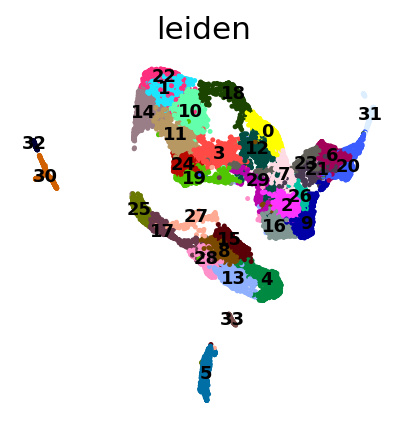

In [55]:
adata = raw[raw.obs["SampleID"] == "PCW3_wholebody_rep1"]
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='cell_ranger')
sc.pp.pca(adata, n_comps = 10)
sc.pp.neighbors(adata, n_pcs =10)
sc.tl.umap(adata, min_dist = 0.1)
sc.tl.leiden(adata, resolution=2)
sc.pl.umap(adata,color=['SIX1', 'EPCAM', 'SIX3', 'FOXE3', 'WNT6', 'CDH1', 'OLIG1', #placode/ epidermal
                        'CDH2', 'OTX2', 'GBX2', 'PAX6', 'CDH1', 'CDH2', 'DLX5', 'EN1', 'EGR2', 'SOX3', 'PAX2', 'PAX3', 'PAX8', #neural
                        'FOXD3','SOX10', 'TFAP2A', #neural crest
                        'TBX6', 'TBXT', #Notochord/ NMP/ posterior
                        'EYA1', 'MEOX1', 'MESP1', 'MIXL1', 'FGF3', 'MYF5',#mesodermal
                        'MIXL1', 'SOX17', 'PAX1', 'GATA4', 'FOXA2', 'PECAM1', 'CLDN5', #endodermal/ endothelial
                        'AHNAK', #extraembryonic
                        'UNCX', 'PAX1', 'MEOX1', #somite
                        'leiden'
                       ], ncols = 8, size = 20)
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(3,3), facecolor='white')
sc.pl.umap(adata,color=['leiden'], legend_loc = 'on data', ncols = 9, size = 20, legend_fontsize = 'xx-small')

In [56]:
PCW3_wholebody_rep1 = adata[adata.obs['leiden'].isin(['15', '8', '28', '13', '4', '27', '17'])]

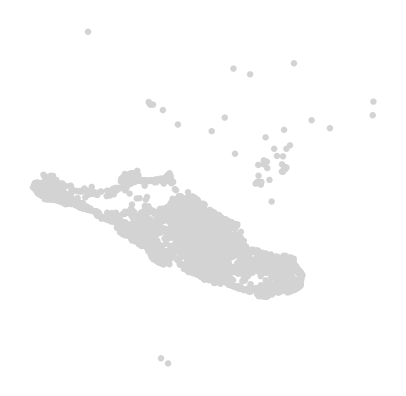

In [57]:
sc.pl.umap(PCW3_wholebody_rep1)

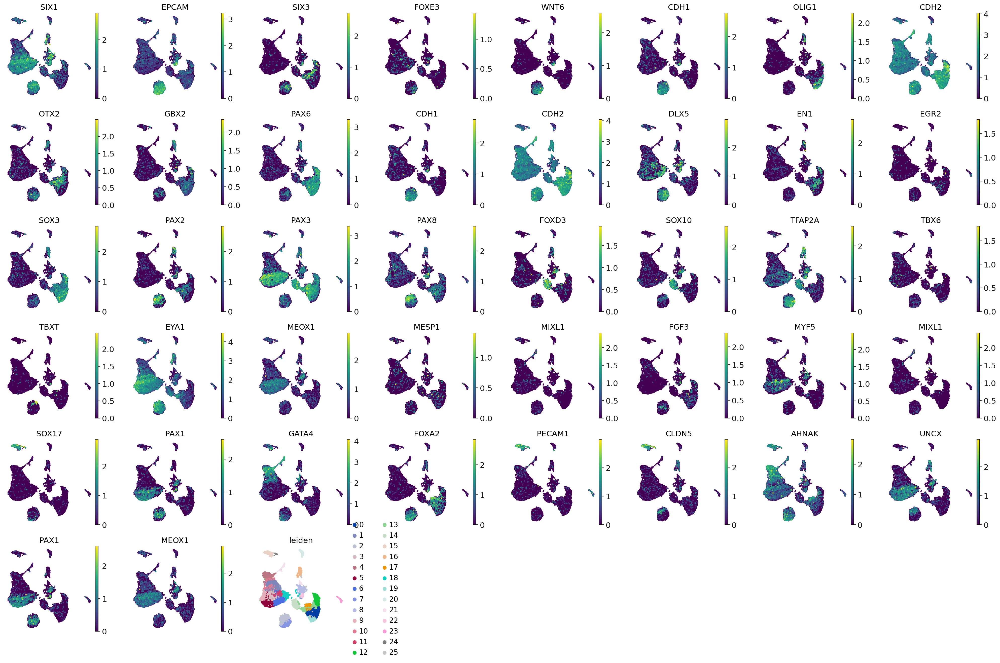

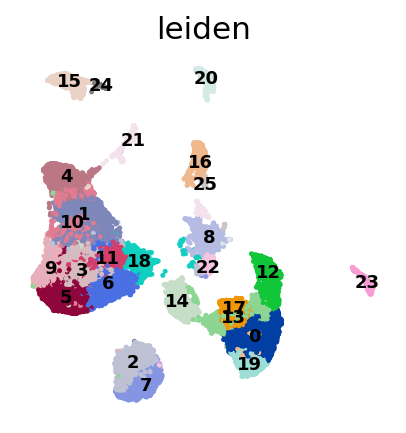

In [58]:
adata = raw[raw.obs["SampleID"] == "PCW4_wholebody_rep1"]
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='cell_ranger')
sc.pp.pca(adata, n_comps = 10)
sc.pp.neighbors(adata, n_pcs =10)
sc.tl.umap(adata, min_dist = 0.1)
sc.tl.leiden(adata, resolution=1)
sc.pl.umap(adata,color=['SIX1', 'EPCAM', 'SIX3', 'FOXE3', 'WNT6', 'CDH1', 'OLIG1', #placode/ epidermal
                        'CDH2', 'OTX2', 'GBX2', 'PAX6', 'CDH1', 'CDH2', 'DLX5', 'EN1', 'EGR2', 'SOX3', 'PAX2', 'PAX3', 'PAX8', #neural
                        'FOXD3','SOX10', 'TFAP2A', #neural crest
                        'TBX6', 'TBXT', #Notochord/ NMP/ posterior
                        'EYA1', 'MEOX1', 'MESP1', 'MIXL1', 'FGF3', 'MYF5',#mesodermal
                        'MIXL1', 'SOX17', 'PAX1', 'GATA4', 'FOXA2', 'PECAM1', 'CLDN5', #endodermal/ endothelial
                        'AHNAK', #extraembryonic
                        'UNCX', 'PAX1', 'MEOX1', #somite
                        'leiden'
                       ], ncols = 8, size = 20)
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(3,3), facecolor='white')
sc.pl.umap(adata,color=['leiden'], legend_loc = 'on data', ncols = 9, size = 20, legend_fontsize = 'xx-small')

In [59]:
PCW4_wholebody_rep1 = adata[adata.obs['leiden'].isin(['2', '7', '14', '17', '13', '0', '19', '12'])]                                                

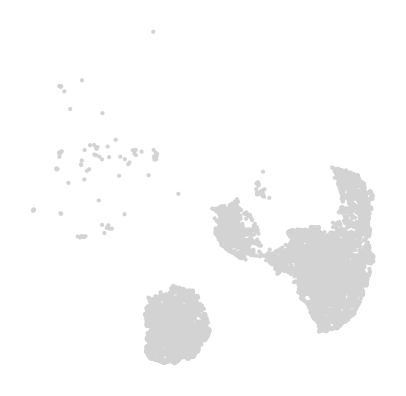

In [60]:
sc.pl.umap(PCW4_wholebody_rep1)

In [61]:
Epi =  PCW4_wholebody_rep1.concatenate(PCW3_wholebody_rep1,
                                      #PCW4_wholehead_rep2,
                                      #PCW5_wholehead_rep2,
                                      #PCW5_wholehead_rep3,
                      fill_value = 0, index_unique= None)
                                      # batch_categories = ['1', '0'])#'2','3'])#'3','4','5'


#https://github.com/scverse/scanpy/issues/55
#Instead of passing a keys parameter to AnnData.concatenate(), I would pass a "multi_index" parameter, that triggers passing batch_categories=[0, 1, ..., n_datasets] to the keys parameter of pandas.concat. This is then consistent with the content of the batch field.

In [62]:
PCW4_wholebody_rep1.obs

,stage,SampleID,region,batch,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,total_counts_RPS,pct_counts_RPS,total_counts_RPL,pct_counts_RPL,doublet_score,predicted_doublet,leiden
AAACCCAAGACCATTC-2,PCW4,PCW4_wholebody_rep1,whole_body,1,7905,7905,42025.0,1496.0,3.559786,3323.0,7.907198,4751.0,11.305176,0.055224,False,2
AAACCCACAAAGGCTG-2,PCW4,PCW4_wholebody_rep1,whole_body,1,3651,3651,11950.0,354.0,2.962343,1600.0,13.389121,2180.0,18.242678,0.031071,False,7
AAACCCACAAGCCATT-2,PCW4,PCW4_wholebody_rep1,whole_body,1,1681,1681,3803.0,24.0,0.631081,465.0,12.227189,695.0,18.275047,0.037523,False,12
AAACCCACATGACACT-2,PCW4,PCW4_wholebody_rep1,whole_body,1,5450,5450,17599.0,466.0,2.647878,1595.0,9.063015,2231.0,12.676856,0.059030,False,0
AAACCCAGTTAAGCAA-2,PCW4,PCW4_wholebody_rep1,whole_body,1,5265,5265,18446.0,541.0,2.932885,2087.0,11.314106,2765.0,14.989699,0.030002,False,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAACTAAG-2,PCW4,PCW4_wholebody_rep1,whole_body,1,3289,3289,7997.0,564.0,7.052645,551.0,6.890084,801.0,10.016255,0.029311,False,2
TTTGTTGGTTCCGTTC-2,PCW4,PCW4_wholebody_rep1,whole_body,1,3999,3999,11355.0,378.0,3.328930,1039.0,9.150154,1374.0,12.100396,0.066849,False,14
TTTGTTGGTTGGGTAG-2,PCW4,PCW4_wholebody_rep1,whole_body,1,5281,5281,21369.0,3329.0,15.578643,1865.0,8.727596,2637.0,12.340305,0.092105,False,2
TTTGTTGGTTGTGTTG-2,PCW4,PCW4_wholebody_rep1,whole_body,1,7940,7940,57171.0,3706.0,6.482307,6614.0,11.568803,9173.0,16.044847,0.081030,False,2


In [63]:
Epi.var = Epi.var[['MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'RPS', 'RPL', 'mean', 'std']]

In [64]:
Epi.obs

,stage,SampleID,region,batch,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,total_counts_RPS,pct_counts_RPS,total_counts_RPL,pct_counts_RPL,doublet_score,predicted_doublet,leiden
AAACCCAAGACCATTC-2,PCW4,PCW4_wholebody_rep1,whole_body,0,7905,7905,42025.0,1496.0,3.559786,3323.0,7.907198,4751.0,11.305176,0.055224,False,2
AAACCCACAAAGGCTG-2,PCW4,PCW4_wholebody_rep1,whole_body,0,3651,3651,11950.0,354.0,2.962343,1600.0,13.389121,2180.0,18.242678,0.031071,False,7
AAACCCACAAGCCATT-2,PCW4,PCW4_wholebody_rep1,whole_body,0,1681,1681,3803.0,24.0,0.631081,465.0,12.227189,695.0,18.275047,0.037523,False,12
AAACCCACATGACACT-2,PCW4,PCW4_wholebody_rep1,whole_body,0,5450,5450,17599.0,466.0,2.647878,1595.0,9.063015,2231.0,12.676856,0.059030,False,0
AAACCCAGTTAAGCAA-2,PCW4,PCW4_wholebody_rep1,whole_body,0,5265,5265,18446.0,541.0,2.932885,2087.0,11.314106,2765.0,14.989699,0.030002,False,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGGTACTCT-1,PCW3,PCW3_wholebody_rep1,whole_body,1,3525,3525,10698.0,94.0,0.878669,1227.0,11.469434,1871.0,17.489250,0.028636,False,17
TTTGTCACAGCATACT-1,PCW3,PCW3_wholebody_rep1,whole_body,1,1404,1404,5486.0,0.0,0.000000,1087.0,19.814072,1614.0,29.420343,0.020403,False,27
TTTGTCACAGCTATTG-1,PCW3,PCW3_wholebody_rep1,whole_body,1,1259,1259,2102.0,15.0,0.713606,194.0,9.229305,274.0,13.035205,0.014661,False,13
TTTGTCAGTGATGTGG-1,PCW3,PCW3_wholebody_rep1,whole_body,1,1921,1921,8889.0,4.0,0.044999,1794.0,20.182247,2619.0,29.463381,0.018543,False,27


In [65]:
#this is the original, working one (with barcodes mismatching scATAC)

#AnnData object with n_obs × n_vars = 74159 × 8318
#    obs: 'Stage', 'SampleID', 'Lab', 'Region', 'Accession', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Rps', 'pct_counts_Rps', 'total_counts_Rpl', 'pct_counts_Rpl', 'doublet_score', 'predicted_doublet', 'leiden'
#    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'Rps', 'Rpl', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
#    obsm: 'X_pca', 'X_umap'
#    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [66]:
Epi

AnnData object with n_obs × n_vars = 12324 × 8108
    obs: 'stage', 'SampleID', 'region', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'total_counts_RPS', 'pct_counts_RPS', 'total_counts_RPL', 'pct_counts_RPL', 'doublet_score', 'predicted_doublet', 'leiden'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'RPS', 'RPL', 'mean', 'std'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [67]:
Epi.write(os.path.join(work_dir, 'scRNA/All_Epi_combined_withvelo.h5ad'), compression='gzip')